<a href="https://colab.research.google.com/github/shree180103/W_GAN/blob/main/w_gan_cifar10_exp1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import torch
from torch import nn
from torch.utils.data import DataLoader
import torchvision
from torchvision.transforms import ToTensor
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter

In [4]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
class Discriminator(nn.Module):
  def __init__(self,input_shape:int):
    super().__init__()
    self.conv_layer=nn.Sequential(
        nn.Conv2d(in_channels=input_shape,out_channels=64,kernel_size=4,stride=2,padding=1,bias=False),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Conv2d(in_channels=64,out_channels=128,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Conv2d(in_channels=128,out_channels=256,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Conv2d(in_channels=256,out_channels=512,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Conv2d(in_channels=512,out_channels=1,kernel_size=4,stride=1,padding=0,bias=False)

    )

  def forward(self,x):
    return self.conv_layer(x)


In [6]:
class Generator(nn.Module):
  def __init__(self,z_dim:int,img_channels):
    super().__init__()
    self.trans_conv_layer=nn.Sequential(
        nn.ConvTranspose2d(in_channels=z_dim,out_channels=512,kernel_size=4,stride=1,padding=0,bias=False),
        nn.BatchNorm2d(512),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=512,out_channels=256,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(256),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=256,out_channels=128,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(128),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=128,out_channels=64,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(64),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=64,out_channels=img_channels,kernel_size=4,stride=2,padding=1,bias=False),
        nn.Tanh()


    )

  def forward(self,x):
    return self.trans_conv_layer(x)




In [7]:
device="cuda" if torch.cuda.is_available() else "cpu"
n_c=3

gen=Generator(z_dim=100,img_channels=n_c).to(device)
gen.apply(weights_init)

disc=Discriminator(input_shape=n_c).to(device)
disc.apply(weights_init)


Discriminator(
  (conv_layer): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)

In [9]:
# training params
batch_size=64
lr=0.00005
z_dim=100
img_size=64
n_c=3
n_critic=5
c=0.01

transform=transforms.Compose(transforms=[transforms.ToTensor(),
                                         transforms.Resize((64,64)),
                                         transforms.CenterCrop(img_size),
                                         transforms.Normalize([0.5 for _ in range(n_c)],[0.5 for _ in range(n_c)])])
dataset=datasets.CIFAR10(root="data",transform=transform,download=True)
data_loader=DataLoader(dataset=dataset,batch_size=batch_size,shuffle=True)



100%|██████████| 170498071/170498071 [00:03<00:00, 49667112.29it/s]


Extracting data/cifar-10-python.tar.gz to data


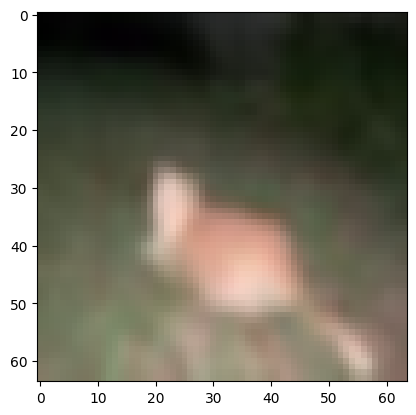

In [10]:
image,label=next(iter(data_loader))
import matplotlib.pyplot as plt
plt.imshow((image[0]*0.5+0.5).permute(1,2,0))
plt.show()

In [11]:
optimizer_disc=torch.optim.RMSprop(params=disc.parameters(),lr=lr)
optimizer_gen=torch.optim.RMSprop(params=gen.parameters(),lr=lr)


In [12]:
writer_fake=SummaryWriter(f"runs/GAN_MNIST/fake")

writer_real=SummaryWriter(f"runs/GAN_MNIST/real")

step = 0

fixed_noise = torch.randn(size=(64,z_dim,1,1))

In [13]:
# z=torch.rand(size=(1,100,1,1))
# z.shape

In [14]:
# img,label=next(iter(data_loader))
# img.shape

In [15]:
!pip install torchinfo

In [16]:
from torchinfo import summary

summary(disc,input_size=[1,3,64,64])

Layer (type:depth-idx)                   Output Shape              Param #
Discriminator                            [1, 1, 1, 1]              --
├─Sequential: 1-1                        [1, 1, 1, 1]              --
│    └─Conv2d: 2-1                       [1, 64, 32, 32]           3,072
│    └─LeakyReLU: 2-2                    [1, 64, 32, 32]           --
│    └─Conv2d: 2-3                       [1, 128, 16, 16]          131,072
│    └─BatchNorm2d: 2-4                  [1, 128, 16, 16]          256
│    └─LeakyReLU: 2-5                    [1, 128, 16, 16]          --
│    └─Conv2d: 2-6                       [1, 256, 8, 8]            524,288
│    └─BatchNorm2d: 2-7                  [1, 256, 8, 8]            512
│    └─LeakyReLU: 2-8                    [1, 256, 8, 8]            --
│    └─Conv2d: 2-9                       [1, 512, 4, 4]            2,097,152
│    └─BatchNorm2d: 2-10                 [1, 512, 4, 4]            1,024
│    └─LeakyReLU: 2-11                   [1, 512, 4, 4]     

In [17]:
# disc.eval()
# with torch.inference_mode():
#   print(disc(torch.rand(size=(1,1,64,64)).to('cuda')).shape)


In [18]:
# disc.eval()
# with torch.inference_mode():
#   print(disc(torch.rand(size=(1,1,64,64)).to('cuda')).shape)

In [19]:
summary(gen,input_size=[1,100,1,1])

Layer (type:depth-idx)                   Output Shape              Param #
Generator                                [1, 3, 64, 64]            --
├─Sequential: 1-1                        [1, 3, 64, 64]            --
│    └─ConvTranspose2d: 2-1              [1, 512, 4, 4]            819,200
│    └─BatchNorm2d: 2-2                  [1, 512, 4, 4]            1,024
│    └─ReLU: 2-3                         [1, 512, 4, 4]            --
│    └─ConvTranspose2d: 2-4              [1, 256, 8, 8]            2,097,152
│    └─BatchNorm2d: 2-5                  [1, 256, 8, 8]            512
│    └─ReLU: 2-6                         [1, 256, 8, 8]            --
│    └─ConvTranspose2d: 2-7              [1, 128, 16, 16]          524,288
│    └─BatchNorm2d: 2-8                  [1, 128, 16, 16]          256
│    └─ReLU: 2-9                         [1, 128, 16, 16]          --
│    └─ConvTranspose2d: 2-10             [1, 64, 32, 32]           131,072
│    └─BatchNorm2d: 2-11                 [1, 64, 32, 32]  

In [20]:
# gen.eval()
# with torch.inference_mode():
#   print(gen(z.to('cuda')).shape)

In [21]:
from tqdm.auto import tqdm

epochs=5


for epoch in tqdm(range(epochs)):
  for batch_idx,(x,_) in enumerate(data_loader):
    z=torch.randn(size=(batch_size,100,1,1),device=device)

    ## traing the discriminator
    for i in range(n_critic):
      disc.zero_grad()

      disc_real_dist=disc(x.to('cuda')).reshape(-1)
      fake=gen(z.to('cuda'))
      disc_gen_dist=disc(fake.detach().to('cuda')).reshape(-1)
      loss_disc= -(disc_real_dist.mean() - disc_gen_dist.mean())

      loss_disc.backward()
      optimizer_disc.step()

      for p in disc.parameters():
        p.data.clamp_(-c,c)

    #training generator
    gen.zero_grad()

    disc_gen_dist=disc(fake.to('cuda')).reshape(-1)


    loss_gen=-disc_gen_dist.mean()

    loss_gen.backward()

    optimizer_gen.step()

    if batch_idx % 100== 0:
            print(
                f"Epoch [{epoch}/{epochs}] Batch {batch_idx}/{len(data_loader)} \
                  Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}"
            )

            with torch.no_grad():
                fake = gen(fixed_noise.to('cuda')).detach()
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(x[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)

                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)

            step += 1











  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [0/5] Batch 0/782                   Loss D: -0.0268, loss G: 0.0215
Epoch [0/5] Batch 100/782                   Loss D: -1.1173, loss G: 0.5919
Epoch [0/5] Batch 200/782                   Loss D: -1.2883, loss G: 0.6672
Epoch [0/5] Batch 300/782                   Loss D: -1.3379, loss G: 0.6791
Epoch [0/5] Batch 400/782                   Loss D: -1.2739, loss G: 0.6410
Epoch [0/5] Batch 500/782                   Loss D: -1.3584, loss G: 0.6879
Epoch [0/5] Batch 600/782                   Loss D: -1.3520, loss G: 0.6776
Epoch [0/5] Batch 700/782                   Loss D: -1.2770, loss G: 0.6674
Epoch [1/5] Batch 0/782                   Loss D: -1.3748, loss G: 0.6872
Epoch [1/5] Batch 100/782                   Loss D: -1.4077, loss G: 0.7044
Epoch [1/5] Batch 200/782                   Loss D: -1.3192, loss G: 0.6596
Epoch [1/5] Batch 300/782                   Loss D: -1.3024, loss G: 0.6522
Epoch [1/5] Batch 400/782                   Loss D: -0.4680, loss G: 0.5777
Epoch [1/5] Batc

In [22]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [23]:
noise=torch.rand(size=(batch_size,z_dim,1,1)).to(device)
gen_img=gen(noise)

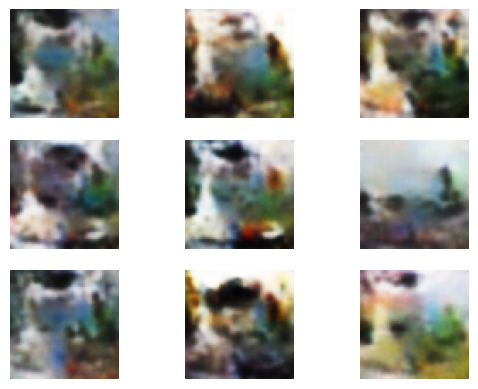

In [24]:
with torch.inference_mode():
  for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow((gen_img[i]*0.5+0.5).cpu().permute(1,2,0))
    plt.axis(False)